# Introduction

The existing stitch algorithms tend to be horizontal-biased, they are good at stitching horizontally adjacent images but not so good for vertically adjacent images. For this reason, many tries have failed to stitch horizontal cylinder rings first and stitch those rings(HFVL: Horizontal First and Vertical Last).

So, in this experiment, we try VFHL(Vertical First and then Horizontal Last) method.

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import os
import cv2 as cv
import numpy as np
import math
import matplotlib.pyplot as plt

from libpano import ImageCropper
from libpano import Config
from libpano import Stitcher
from libpano import FocalCalculator
from libpano import MetaData
from libpano import Preprocess

In [3]:
image_id = 'recent-04'
folder = '../images/' + image_id
meta = MetaData.MetaData(folder)
df = meta.grid_data
print(meta.metrics)

Camera Metrics:
	Focal Length: 4.4589 mm
	Focal Length: 1588.26 px
	Sensor Size: 4.2447996 x 5.6447997 mm
	Pixels per mm: 356.20 x 357.14 px/mm
Panorama Metrics:
	Frame Size: 1512px x 2016px
	Frame Count: 15 x 5
	Interval Angle: 24.0︒ x 36.0︒
	AoV: 50.9081︒ x 64.6661︒
	PPR: 1701.7168px x 1786.2268px
	Panorama Size: 10692.2019px x 5611.5971px



In [4]:
df[df.col==3]

,row,col,uri,pitch,roll,yaw
3,0,3,img-r3-287.jpg,-70.238419,4.327511,90.196442
18,1,3,img-r2-262.jpg,-34.268890,4.083546,88.181946
33,2,3,img-r1-240.jpg,1.669483,1.424618,89.764771
48,3,3,img-r4-311.jpg,37.625065,1.582782,89.328613
63,4,3,img-r5-336.jpg,73.426727,-4.581013,90.960724


This shows that the images in the same column of the grid have little deviation in its yaw values. It gives me a bright hope that vertical stitching could go well.

## Define Fuctions

In [5]:
def stitch_horizontal(images, show=True):
    stitcher = cv.Stitcher.create(cv.Stitcher_PANORAMA)
    status, pano = stitcher.stitch(images)

    if status != cv.Stitcher_OK:
        print("Can't stitch images, error code = %d" % status)
        return None
    else:
        if show:
            plt.figure(figsize=(20, 8))
            plt.imshow(pano)
            plt.show()
        return pano

In [6]:
def stitch_vertical(images, show=True):
    for idx in range(len(images)):
        images[idx] = np.rot90(images[idx], k=1, axes=(0,1))
    
    pano = stitch_horizontal(images, show)
    
    if pano is None:
        return None
    
    return np.rot90(pano, k=-1, axes=(0,1))
        

## Vertical stitching First

Column 0


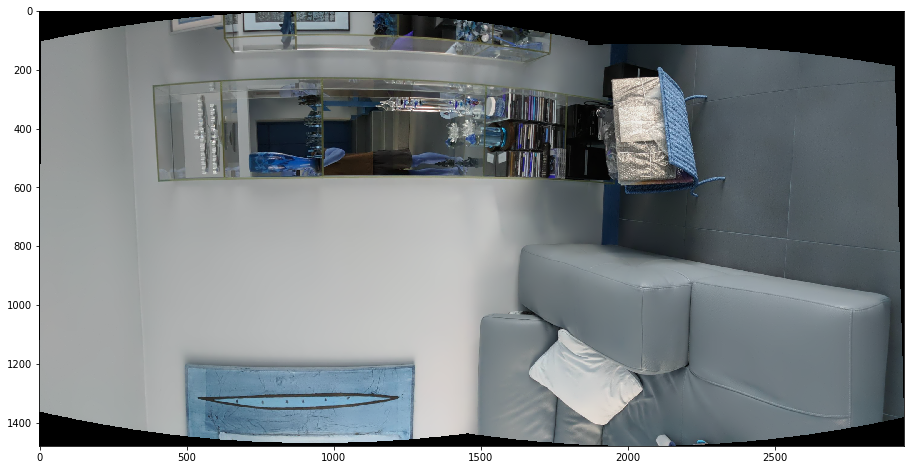

Column 1


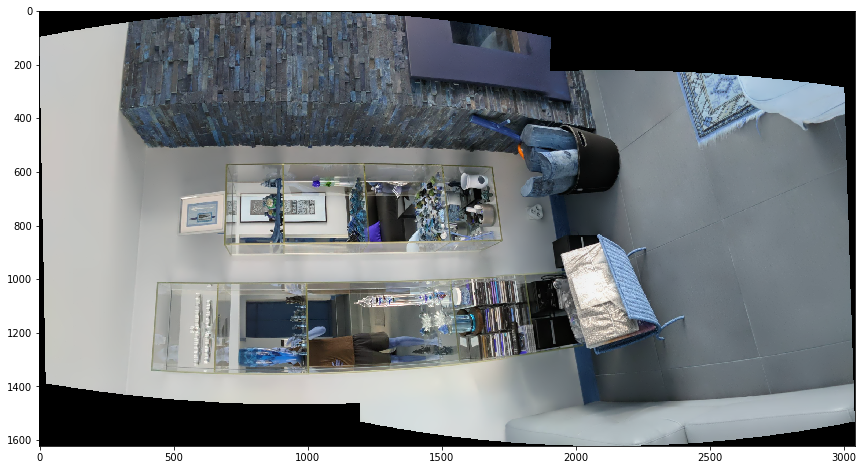

Column 2


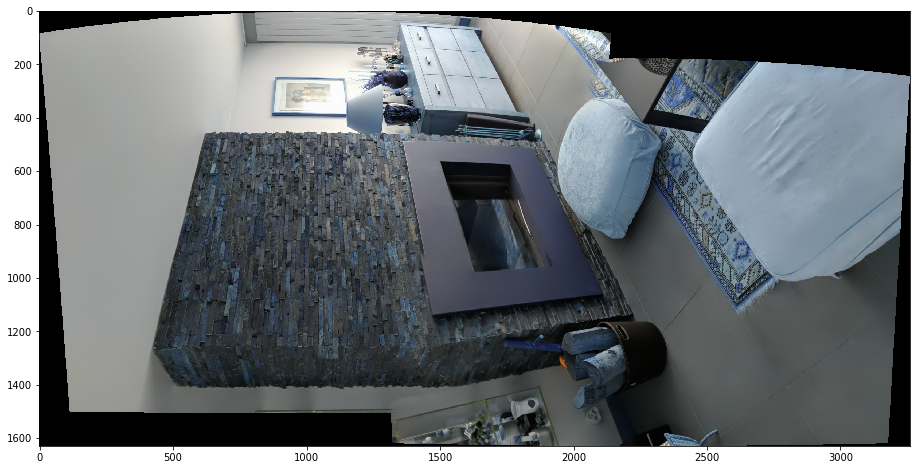

Column 3
Can't stitch images, error code = 1
Column 4
Can't stitch images, error code = 1
Column 5


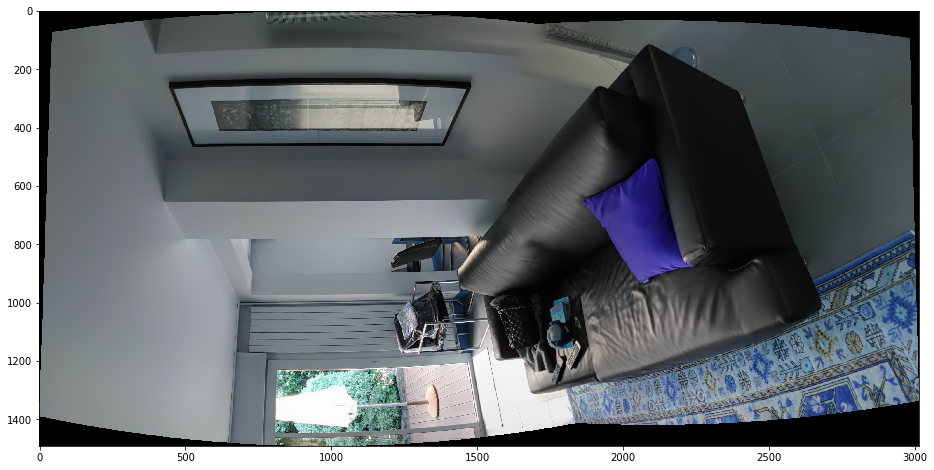

Column 6
Can't stitch images, error code = 3
Column 7


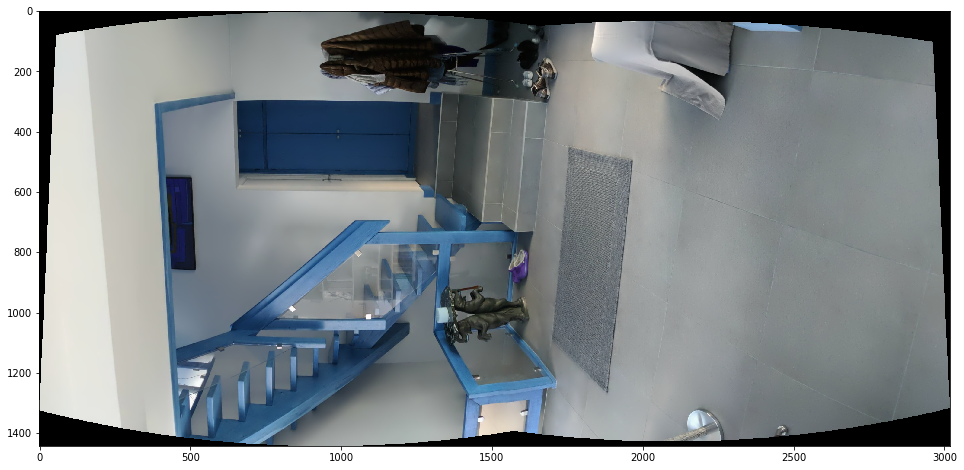

Column 8


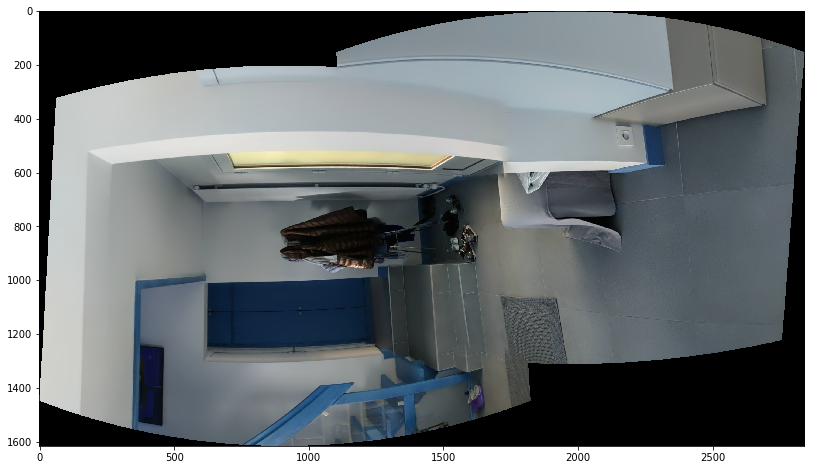

Column 9
Can't stitch images, error code = 1
Column 10


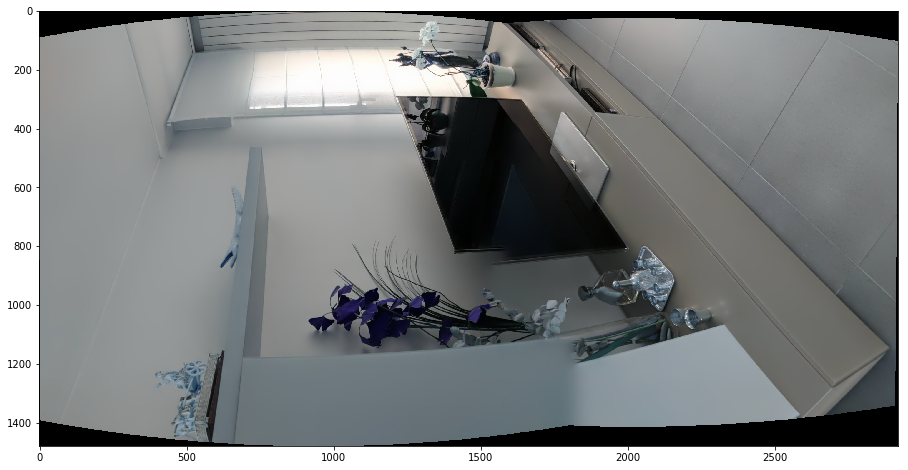

Column 11


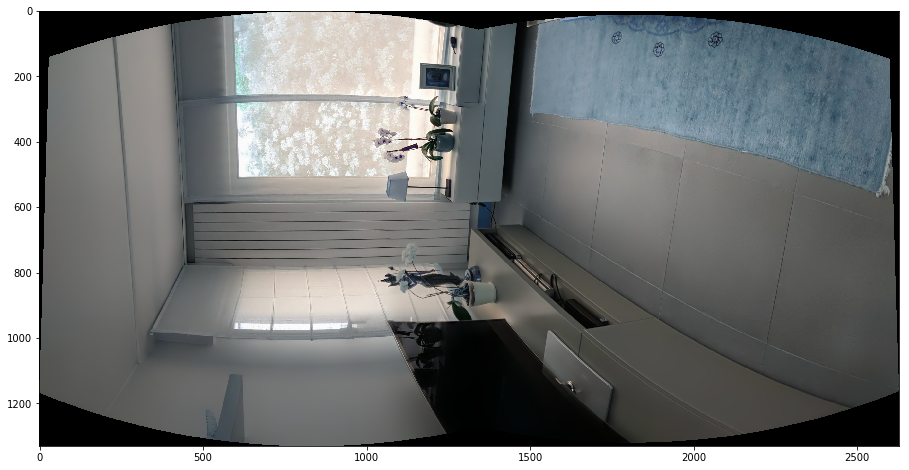

Column 12


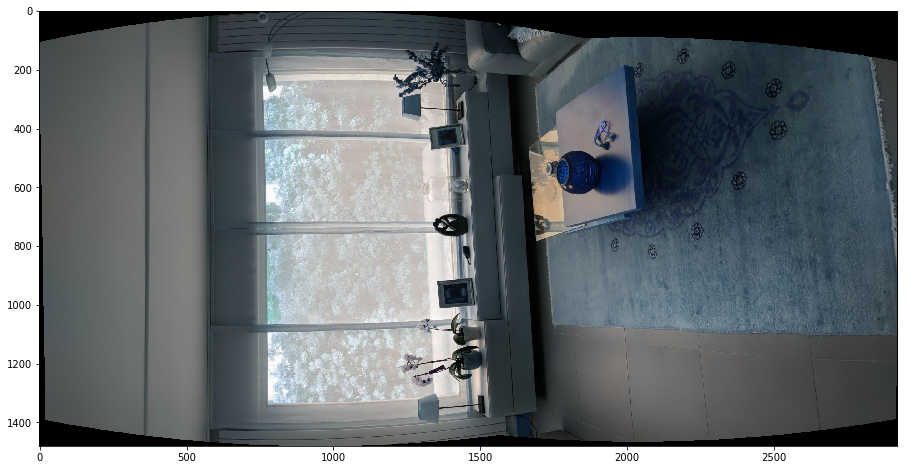

Column 13


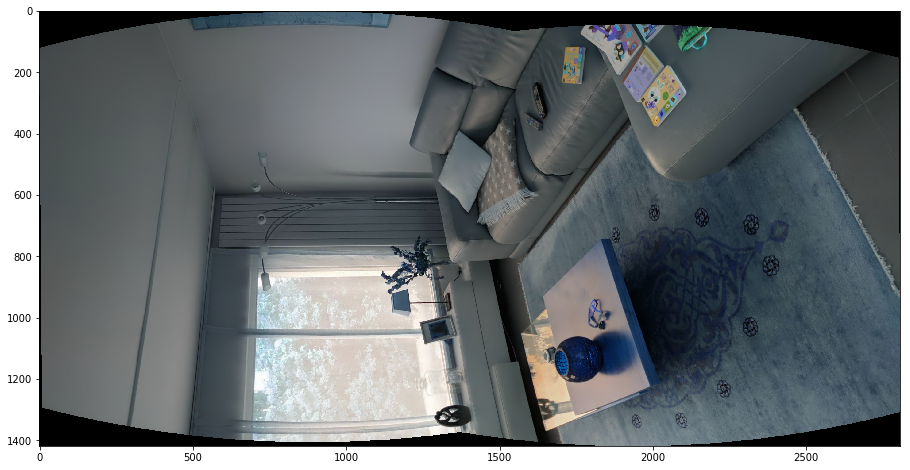

Column 14
Can't stitch images, error code = 1


In [7]:
panos = []
failed_columns = []

for col in range(df.col.nunique()):
    print('Column', col)
    
    uris = df[df.col == col].uri.values.tolist()
    images = [cv.imread(folder + '/' + uri) for uri in uris]
    
    pano = stitch_vertical(images)
    
    if pano is not None:
        panos.append(pano)
    else:
        failed_columns.append(col)
    

### Result

1. #### 10/15 panoramas were success, but 5 were failed. 
> We should find out why 5 panoramas were failed. Column 3, 4, 6, 9, 14
1. #### Only 2/5 images were stitched in every column. TOO LOW!!
> But it's reasonable. I didn't expect that the most top and bottom rows could be stitched. If the 3 middle rows can be stitched, we can call it a GREATE SUCCESS.
> And, in this image set, the row above the equator contains only walls and ceils, and it's obvious they could not be stitched properly.
1. #### Some stitching result were not so good.
> Some stitching errors are inevitable, because this photos were taken in an indoor environment. Objects are so close to the camera that it is possible an object which was in the previous photo might disappear in the next photo. This results in stitching error.

## Horizontal stitching Last

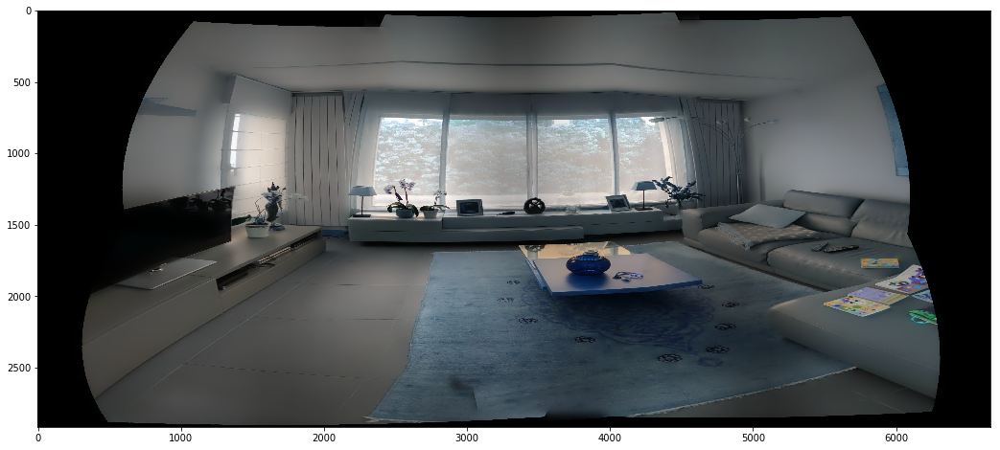

In [8]:
pano = stitch_horizontal(panos)

In [9]:
cv.imwrite('vfhl.jpg', pano)

True

### Result
* #### VFHL method is OK if and only if vertical stitching goes well.

## If we crop stitching results?

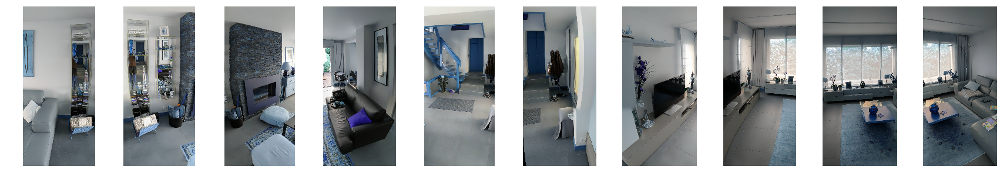

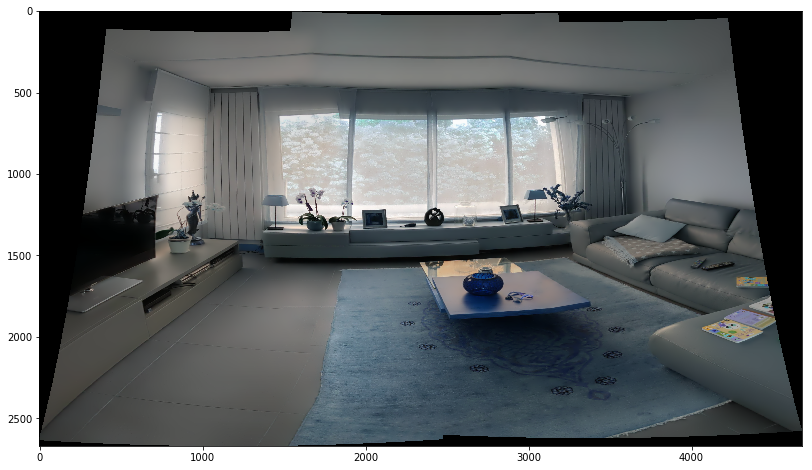

In [10]:
cropped_panos = [ImageCropper.ImageCropper(img).crop() for img in panos]

count = len(cropped_panos)
_, ax = plt.subplots(1, count, figsize=(30, 5))
for idx in range(count):
    ax[idx].imshow(cropped_panos[idx])
    ax[idx].axis('off')
plt.show()

pano = stitch_horizontal(cropped_panos)

In [11]:
cv.imwrite('vfhl_with_crop.jpg', pano)

True

### Result
* #### We lost one column(the lestmost), but the QoS(quality of stitching) has improved in many places. 
    * Stains have disappeared.
* #### If we find out why vertical stitching fails in some cases, it would be a good startpoint of the overall stitching process.

# Why vertical stitching fails?

In [12]:
failed_columns

[3, 4, 6, 9, 14]

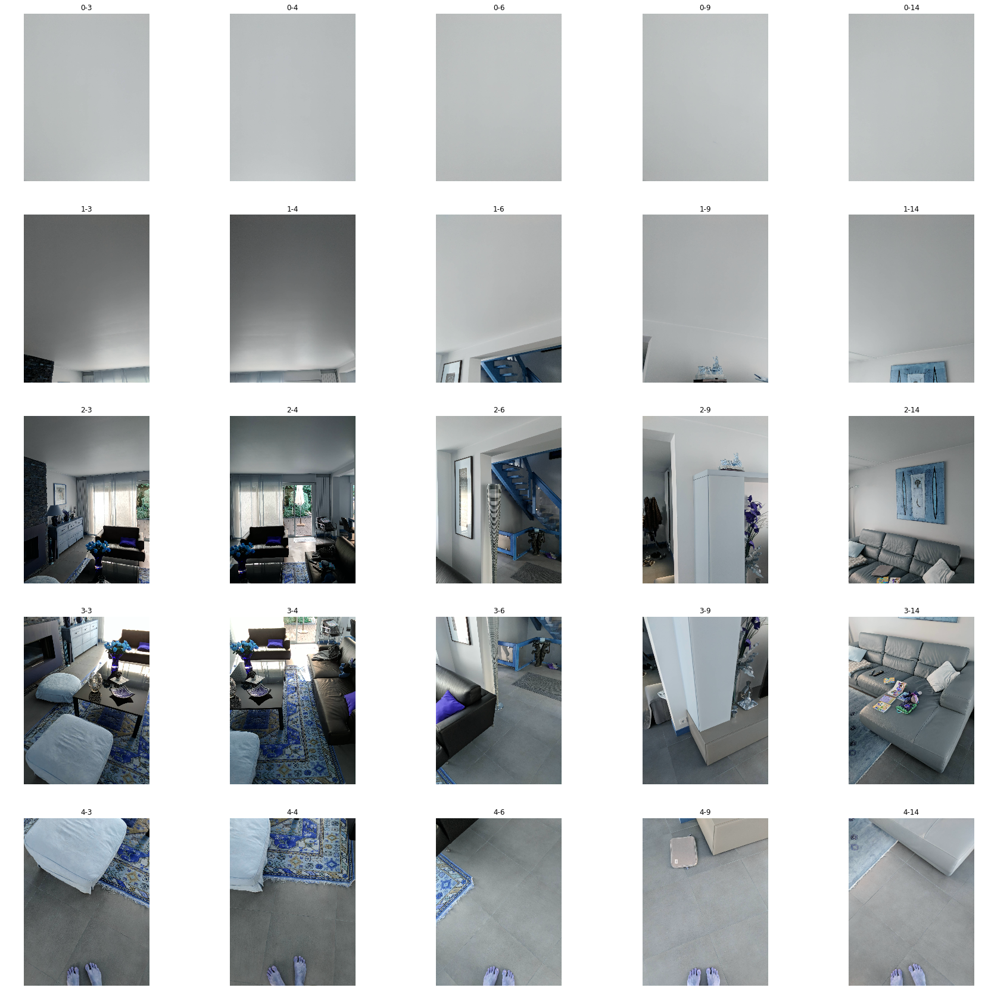

In [14]:
n_rows = df.row.nunique()
n_fails = len(failed_columns)

_, ax = plt.subplots(n_rows, n_fails, figsize=(30, 30))
for row in range(n_rows):
    for idx, col in enumerate(failed_columns):
        cur_ax = ax[row][idx]
        cur_ax.axis('off')
        cur_ax.set_title('{}-{}'.format(row, col))
        
        uri = df[(df.row == row) & (df.col == col)].uri.values[0]
        cur_ax.imshow(cv.imread(folder + '/' + uri))

plt.show()

### Reasons why not stitch?
1. ##### Not enough feature points, especially in ceils and floors.
1. ##### Brightness and contrast difference between adjacent images.
1. ##### Not enough feature points in the overlapping area due to the biased feature point distribution.

These are not the problems only in vertical stitching, but trouble in horizontal stitching also, as well as the major problem in image stitching. 

# Conclusion

* ### VFHS method works well in some cases but not in other cases. 
* ### As long as we don't solve the main problem - 3 reasons of poor stitching, whether vertical stitching is first or last doesn't matter the success.
* ### Our TRASB(Transform-Rough Alignment-Stitching-Blending) approach is the final hope. 